# Einfluss von Helligkeit und Kontrast auf die wahrgenommene Bildqualität  
## Marc Tukendorf, Johannes Tabeling, Marcel Ebermann, Dominik Busse
### Seminar: Visuelle Wahrnehmung beim Menschen und Bildqualität - WiSe 2020/21

In [20]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd    # module to work with data in DataFrames.
import seaborn as sns  # module to plot DataFrames in an easy way

from skimage import data, img_as_float, io
from skimage import exposure

from PIL import Image, ImageEnhance

## 1. Einleitung

Kontrast und Helligkeit können entscheidend für die wahrgenommene Qualität eines Bildes sein. Viele Fernseh- und Bildschirmhersteller machen sich dies zunutze, indem sie ihre Geräte mit "dynamic" Modi präsentieren. 
Wir fragen uns im Rahmen der folgenden Studie, ob die Subjektive Bildqualität wirklich nur mit Veränderung des Kontrastes sowie der Helligkeit erhöht werden kann. Des Weiteren Fragen wir uns welche der beiden Variablen einen größeren Einfluss hat.
Wir prüfen außerdem unsere aufgestellten Hypothesen die wie folgt lauten:

**Inwieweit lässt sich die wahrgenommene Bildqualität durch Veränderung von Helligkeit und Kontrast erhöhen?**
- **H11**: Wenn die Helligkeit und der Kontrast eines Bildes erhöht wird, dann steigt auch die wahrgenommene Bildqualität.
- **H12**: Wenn der Kontrast und die Helligkeit verringert, dann ist die wahrgenommene Bildqualität geringer.
- **H13**: Es existiert ein Optimum ab dem die Erhöhung der Helligkeit bzw. des Kontrastes die wahrgenommene Bildqualität nicht weiter verbessert.

**Welche der beiden Variablen hat den größeren positiven Einfluss auf die wahrgenommene Bildqualität?**
- **H21**: Bei hellen Bildern hat der Kontrast einen stärkeren positiven Einfluss auf die wahrgenommene Bildqualität als die Helligkeit.
- **H22**: Bei dunklen Bildern hat die Helligkeit einen stärkeren positiven Einfluss auf die wahrgenommene Bildqualität als der Kontrast.

## 2. Experimentelles Design


### Wahl der Stimuli und Verzerrungsstufen

Wir haben uns für 15 verschiedene Bilder entschieden, die wir untersuchen wollen. Dabei beinhalten jedes Bild jeweils unterschiedliche Szenarien und Lichtverhältnisse. Bezüglich der Helligkeit haben wir uns dazu entschieden den Gamma-Wert eines Bildes zu variieren, da der Effekt unserer Meinung nach natürlicher Aussieht, als alle Pixel eines Bildes gleichmäßig zu verändern. 

Für jedes der Bilder haben wir bei den Gamma- und Kontrastwerten jeweils 5 Stufen angewendet. Die Stufen sind bei Gamma 0.5, 0.75, 1, 1.25, 1.5 und beim Kontrast 0.5, 0.75, 1, 1.25, 1.5. Dabei entspricht bei beiden die 1 für das ursprüngliche, unveränderte Bild. Wir haben zur Bestimmung des Kontrast-Wertes die *PIL*-Bibliothek und zur Bestimmung des Gamma-Wertes die *skimage*-Bibliothek verwendet. 

In [21]:
# Anpassung des Kontrast- und Gamma-Wertes
def adjust_contrast(img, value):
    return ImageEnhance.Contrast(img).enhance(value)

def adjust_gamma(img, value):
    return exposure.adjust_gamma(img_as_float(img), value)

Die folgende Abbildung zeigt den kompletten Satz der im Experiment verwendeten Stimuli.

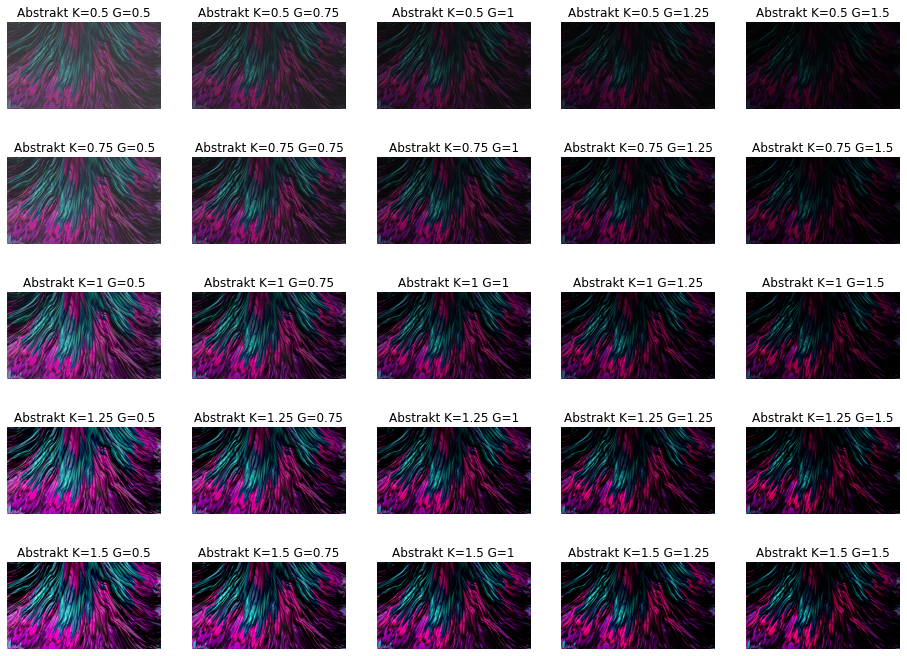

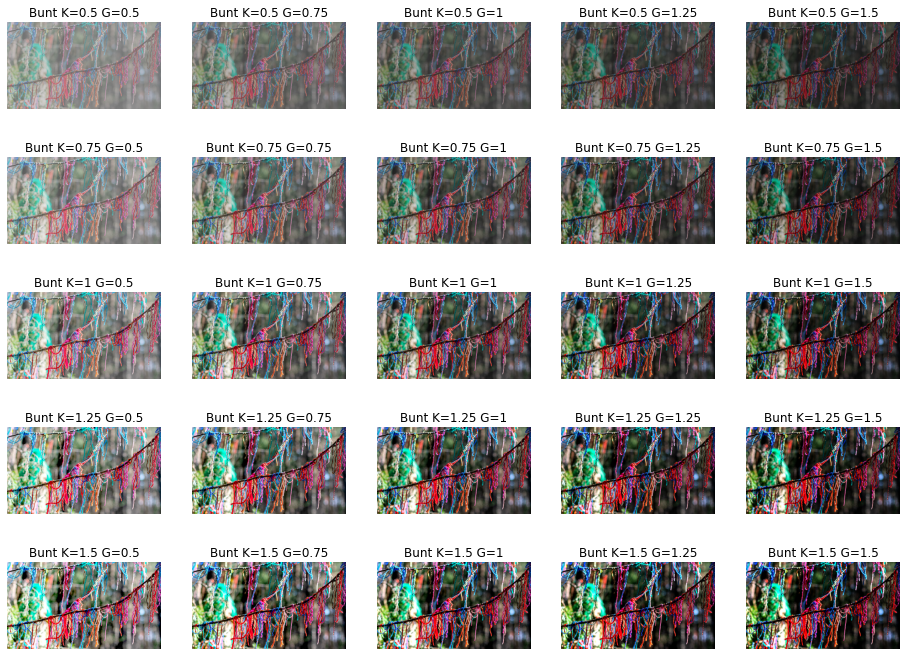

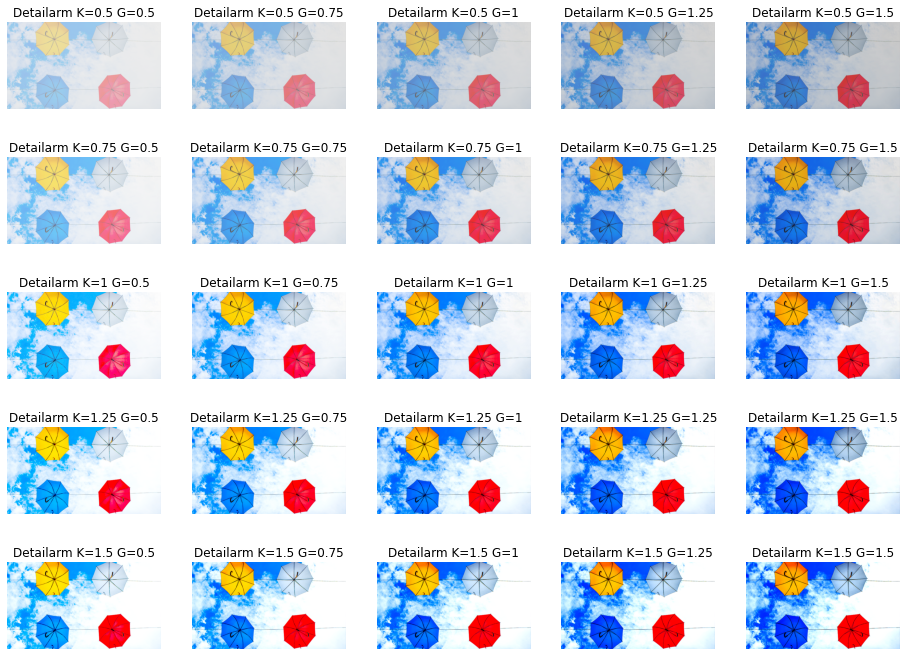

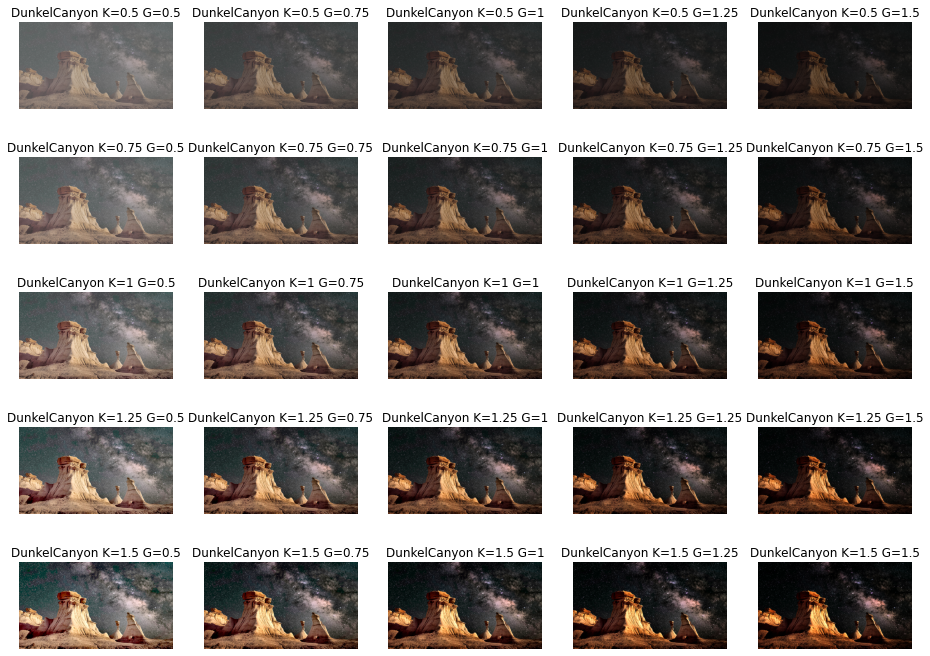

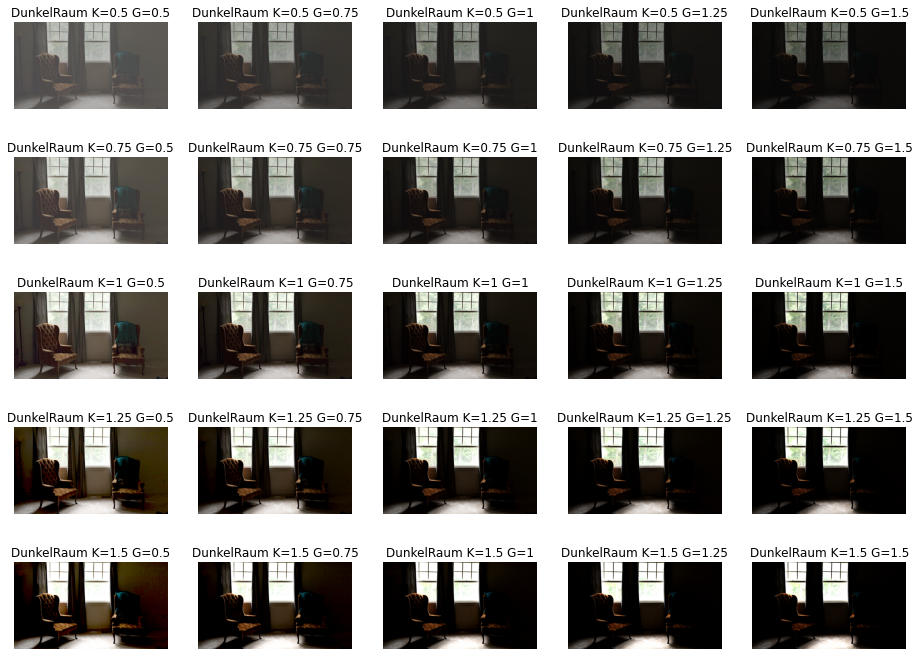

...

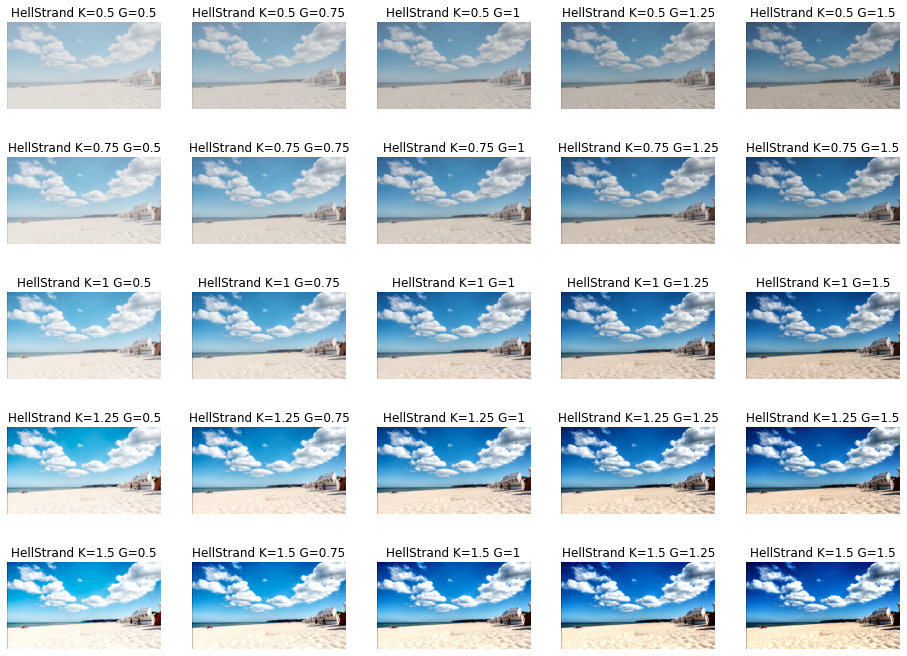

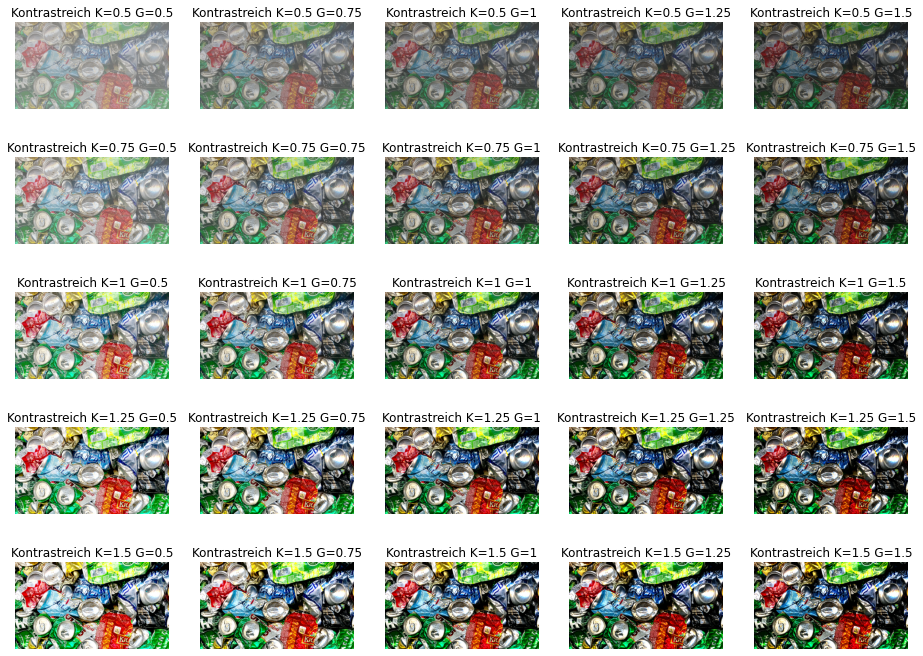

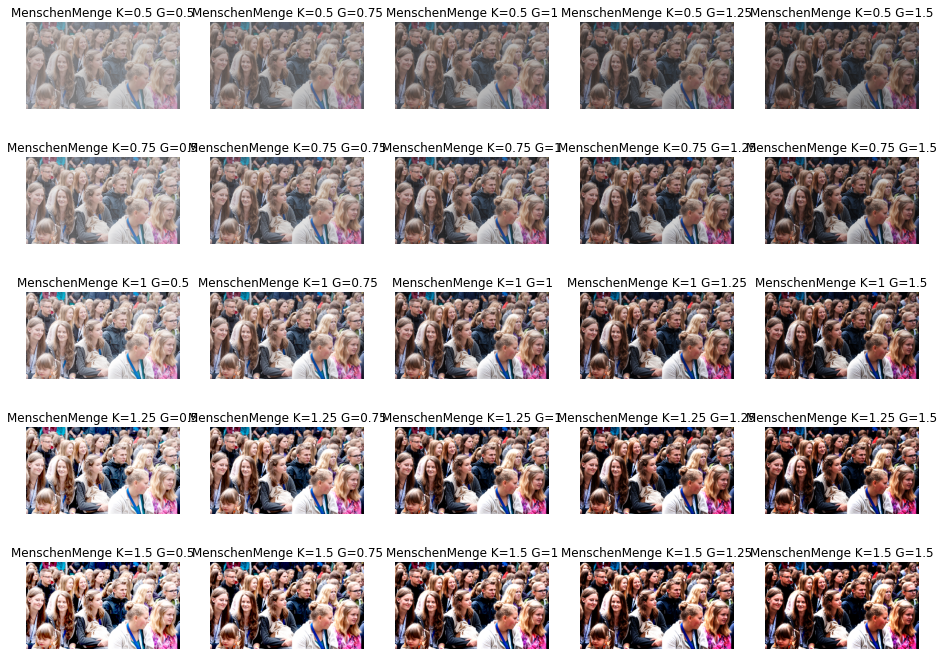

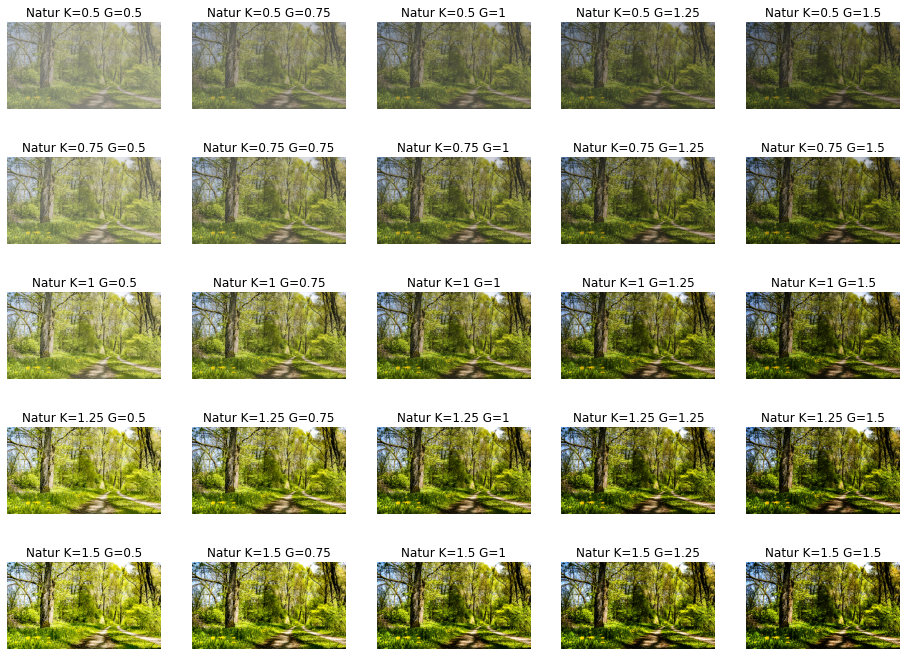

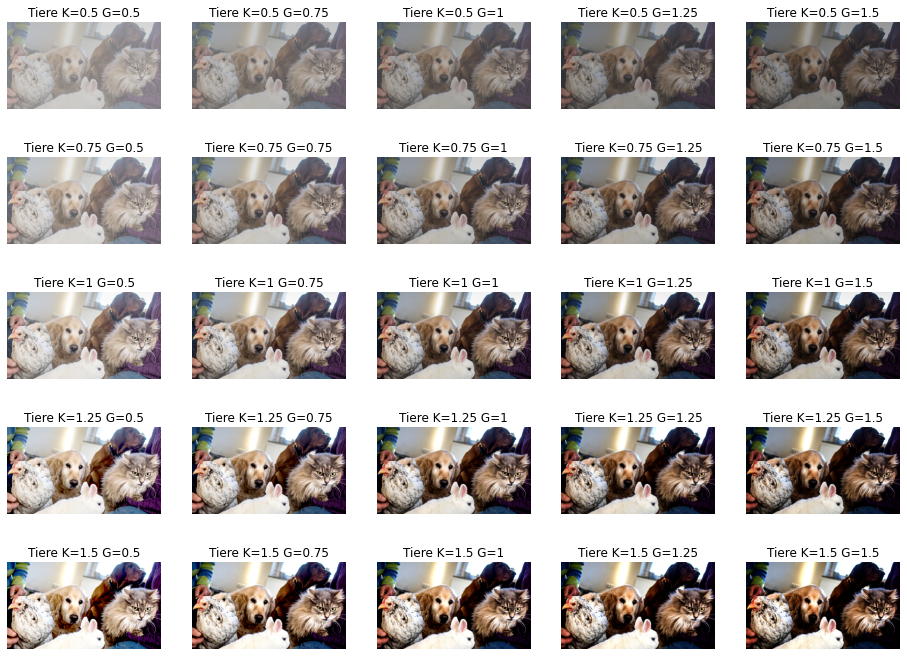

In [41]:
images = ["Abstrakt","Bunt","Detailarm","DunkelCanyon","DunkelRaum","DunkelStadt","Einfarbig","Gebäude","HellFace","HellRaum","HellStrand","Kontrastreich","MenschenMenge","Natur","Tiere"]
contrast_values = [0.5, 0.75, 1, 1.25, 1.5]
gamma_values = [0.5, 0.75, 1, 1.25, 1.5]

for image in images:
    plt.figure(figsize=(16, 12))
    for i, c in enumerate(contrast_values):
        for j, g in enumerate(gamma_values):
            im = Image.open(f'stimuli/{image}.jpg')
            im = adjust_contrast(im, c)
            im = adjust_gamma(im, g)
            
            plt.subplot(5, 5, i*5+j+1)
            plt.imshow(im, cmap='gray', vmin=0, vmax=255); 
            plt.axis('off')
            plt.title(f'{image} K={c} G={g}')

### Versuchsaufbau


Um die wahrgenomme Bildqualität zu messen, haben wir uns dazu entschieden, den mean opinion score für jede Verzerrungsvariante eines Bildes zu berechnen. Die Versuchsperson bekommt hierfür das Originalbild und das verzerrte Bild nebeneinander dargestellt. Die Anordung der beiden Bilder ist dabei zufällig. Die Versuchsperson entscheidet mithilfe eines Slider welches der beiden Bilder ihr besser gefällt. Am Slider sind Label angebracht, die dazu beitragen sollen, dass die Skalierung von  ähnlich einschätzen kann. Der Wertebereich des Slider ist hierbei [-3,3], wobei alle reelen Zwischenwerte angenommen werden können. Die nächste Abbildung zeigt den Versuchsaufbau exemplarisch für ein Bild.



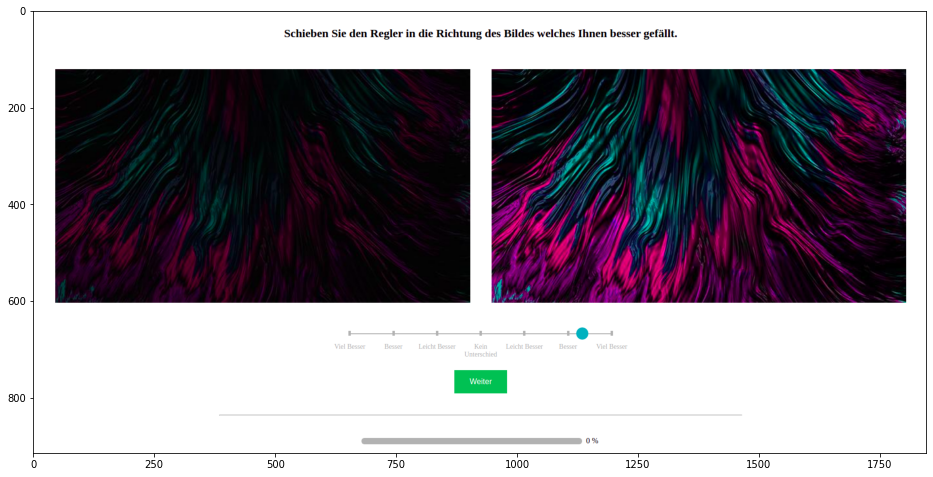

In [52]:
im = Image.open(f'images/website.png')
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(16, 10)
plt.imshow(im, cmap='gray'); 

### Unterteilung in helle und dunkle Bilder

Wir bestimmten die Helligkeit der Bilder um eine Unterteilung der Bilder in hell und dunkel vornehmen zu können. Ziel war es den Moderator für die Bildqualität, bei hellen und dunklen Bildern zu erkennen. Dabei wurden die Bilder in Graustufen umgewandelt und der Effektivwert der Helligkeit für jeden Pixel berechnet.
Für einen Helligkeitswert > 150 wurde das Bild als hell eingestuft. Für einen Wert < 100 wurde es als dunkel eingstuft. Daraus ergaben sich 5 helle und 4 dunkle Bilder.

### Helle Bilder

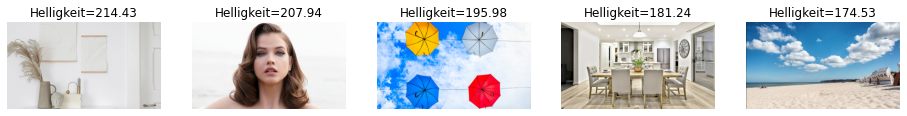

In [84]:
bright_images = {"Einfarbig": 214.43, "HellFace": 207.94,  "Detailarm": 195.98, "HellRaum": 181.24, "HellStrand":174.53}

i=1
plt.figure(figsize=(16, 12))
for image in bright_images:
    im = Image.open(f'stimuli/{image}.jpg')
    plt.subplot(5, 5, i)
    plt.imshow(im, cmap='gray', vmin=0, vmax=255); 
    plt.axis('off')
    plt.title(f'Helligkeit={bright_images[image]}')
    i+=1


### Dunkle Bilder

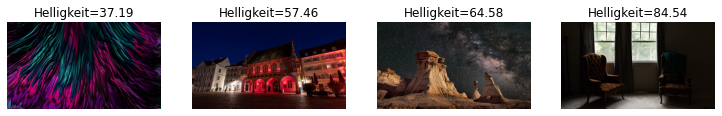

In [85]:
dark_images = {"Abstrakt": 37.19, "DunkelStadt": 57.46, "DunkelCanyon": 64.58,"DunkelRaum": 84.54}

i=1
plt.figure(figsize=(16, 12))
for image in dark_images:
    im = Image.open(f'stimuli/{image}.jpg')
    plt.subplot(5, 5, i)
    plt.imshow(im, cmap='gray', vmin=0, vmax=255); 
    plt.axis('off')
    plt.title(f'Helligkeit={dark_images[image]}')
    i+=1

## 3. Ergebnisse 

Die erste Abbildung zeigt die Wahl der gewählten Quantisierung für alle Versuchspersonen. Dabei fällt auf, dass sich diese sehr an den Labels, welche wir zur Orientierung am Slider angebracht haben gehalten hatten, anstatt von der kontinuierlichkeit des Sliders gebrauch zu machen.

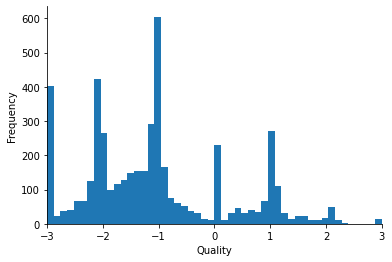

In [81]:
# we read the data
Persons_Count = 13

# concatenates all dataframes in one
df = pd.read_csv('../survey_results/person1/result.csv')
df['observer'] = 'Person1'      # creates a new column called 'observer'

for p in range(2, Persons_Count +1):
    df_current = pd.read_csv('../survey_results/person' + str(p) + '/result.csv')
    df_current['observer'] = 'Person' + str(p)     
    df = pd.concat((df, df_current))        
    
data_dark=df[df["brightness"] < 100]   
data_bright=df[df["brightness"] > 150]  

# distribution of quality values for all category
plt.hist(df['quality_value'], bins=50)
plt.xlabel('Quality')
plt.xlim((-3, 3))
plt.ylabel('Frequency')
sns.despine()

In der zweite Abbildung sehen wir die Bewertung der Bildqualität aller hellen Bilder und vergleichen dabei Kontrast und Gamma. Man erkennt im allgemeinen, dass sich die Bewertung der Bildqualität von Kontraststufe zu Kontraststufe mehr unterscheidet, als von Gammawert zu Gammwert.

Text(0.5, 1.0, 'all bright pictures aggregated')

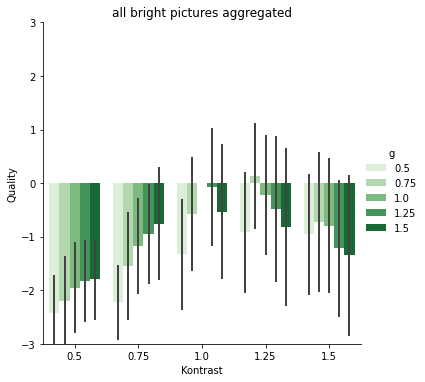

In [34]:
# %% collapsing all bright pictures into one visualization
g = sns.catplot(x='k', y='quality_value', data=data_bright, hue='g',
                kind='bar', ci='sd', errwidth=2,
                palette='Greens')
g.set_ylabels('Quality')
g.set_xlabels('Kontrast')
g.set(ylim = (-3, 3))
plt.title('all bright pictures aggregated')

Die dritte Abbildung zeigt, dass bei den dunklen Bildern einen ähnlichen Verlauf. Auch hier weisst die Bewertung der Bildqualität zwischen den verschiedenen Kontraststufen eine höhere Differenz auf als zwischen den verschiedenen Gammawerten.

Text(0.5, 1.0, 'all dark pictures aggregated')

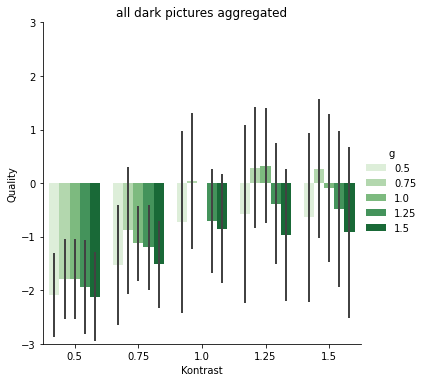

In [35]:
# %% collapsing all dark pictures into one visualization
g = sns.catplot(x='k', y='quality_value', data=data_dark, hue='g',
                kind='bar', ci="sd", errwidth=2,
                palette='Greens')
g.set_ylabels('Quality')
g.set_xlabels('Kontrast')
g.set(ylim = (-3, 3))
plt.title('all dark pictures aggregated')


Betrachtet man zuletzt die Bildqualität über alle Bilder in Abbildung 4 so sieht man im allgemeinen den Verlauf eines umgedrehten-U. Es gibt somit ein Optimum, bei dem eine weitere Erhöhung des Kontrastes und der Helligkeit nur zu einer Verschlechterung der wahrgenommenen Bildqualität führt. Das Optimum liegt über alle Versuchspersonen bei einer Kontrasterhöhung auf 1,25 und eine Aufhellung auf 0,75. 
Man kann erkennen, dass der Kontrast einen größeren Einfluss auf die Bildqualität hat als der Gammawert bzw. die Helligkeit.

Text(0.5, 1.0, 'all pictures aggregated')

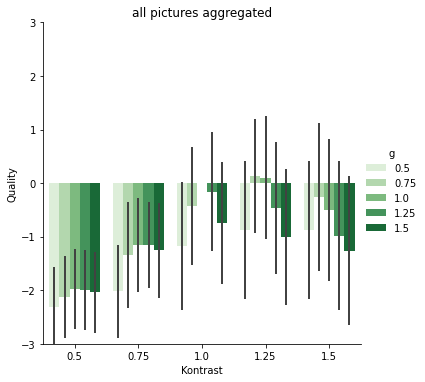

In [36]:
# %% collapsing all pictures into one visualization
g = sns.catplot(x='k', y='quality_value', data=df, hue='g',
                kind='bar', ci='sd', errwidth=2,
                palette='Greens')
g.set_ylabels('Quality')
g.set_xlabels('Kontrast')
g.set(ylim = (-3, 3))
plt.title('all pictures aggregated')

## 4. Diskussion


**Inwieweit lässt sich die wahrgenommene Bildqualität durch Veränderung von Helligkeit und Kontrast erhöhen?**

 Wir stellen fest, dass bei Erhöhung der Variablen Kontrast und Helligkeit eine Erhöung der wahrgenommenen 
 Bildqualität festzustellen ist. Damit lässt die Hypothese **H11** verifizieren. Im Umkehrschluss sinkt bei 
 Verringerung der Variablen die wahrgenommen Bildqualität, wodurch auch Hypothese **H12** zutrifft. 
 Wir stellen jedoch fest, dass die Hypothese **H11** nur bis zu einem bestimmten Grad an Verzerrung zutrifft. Bei 
 einer zu großen Erhöhung des Kontrastes und Helligkeit nimmt die wahrgenommene Bildqualität wieder ab. Diese 
 Beobachtung bestätigt wiederum die Hypothese **H13**.
 
**Welche der beiden Variablen hat den größeren positiven Einfluss auf die wahrgenommene Bildqualität?**

Die Ergebnisse zeigen, dass für helle Bilder der Kontrast einen höheren positiven Einfluss auf die wahrgenommene Bilqualität hat, wodurch sich **H21** bestätigen lässt. Bei dunklen Bildern ist der Einfluss von Helligkeit höher als bei hellen Bildern, dennoch ist auch hier der Einfluss von Kontrast höher. Dadurch wird die Hypothese **H22** wiederlegt.  


**Probleme und Verbesserungsideen**

Während der Durchführung des Experimentes sind uns keine gravierenden Probleme aufgefallen. Es gibt jedoch Punkte, welche bei einer zukünfigen Wiederholung des Experimentes verbessert werden könnten.

- Versuchsbilder einheitlicher und weniger bearbeitet
- Weniger Kategorien dafür mehr Bilder pro Kategorie; z.B nur helle und dunkle Bilder
- Fragestellung auf eine der beiden Variable konzentrieren
- Mehr feinere Abstufungen der Variablen Kontrast und Gamma
- Optimierung der Versuchsbedingungen, wie z.B. gleicher Monitor und Zimmerbeleuchtung für Versuchspersonen


## Referenzen
Abstrakt - https://unsplash.com/photos/pEgsWN0kwbQ \
Bunt - https://unsplash.com/photos/hwSuk9ahH1U \
Detailarm - https://unsplash.com/photos/x1Qw2gCPMUU \
DunkelRaum - https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.myclickmagazine.com%2Flow-light-emotive-picture-inside-home%2F&psig=AOvVaw2esN_E2xS1R5TASXj1j3Ku&ust=1622827832222000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCLC6kPn--_ACFQAAAAAdAAAAABAD \
DunkelStadt - https://www.freiburg.de/pb/1567018.html \
DunkelCanyon - https://unsplash.com/photos/7Ym9rpYtSdA \
Einfarbig - https://www.google.com/url?sa=i&url=https%3A%2F%2Fpassionshake.com%2Fdiy-minimalistic-paper-art%2F&psig=AOvVaw2ugj-PL2ZS-c2Yapt7m5dW&ust=1622828538666000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCLiSzMmB_PACFQAAAAAdAAAAABAV \
Gebäude - https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.nagold.de%2F&psig=AOvVaw0jzhqLDfmFXMIw8qE-8puh&ust=1622826846275000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCKiTtqL7-_ACFQAAAAAdAAAAABAD \
HellRaum - https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.thelightbulb.co.uk%2Fresources%2F4-secrets-well-lit-room%2F&psig=AOvVaw2zGrlvROeaetLtkoCc5quE&ust=1622829196708000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCMD9ooGE_PACFQAAAAAdAAAAABAf \
HellFace - https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.goodfon.com%2Fwallpaper%2Fbarbara-palvin-devushka-vzgliad-litso-model-volosy-krasotka.html&psig=AOvVaw020v6rgXchgdshMzWthrrX&ust=1622830540638000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCPDGwJaJ_PACFQAAAAAdAAAAABAD \
HellStrand - https://www.ab-in-den-urlaub.de/magazin/reisetipps/ruegen-strand/ \
Kontrastreich - https://unsplash.com/photos/x1Qw2gCPMUU \
MenschenMenge - https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.kajak-oldenburg.de%2Fwas-wenn-es-nur-so-aussieht-als-waere-ich-da%2F2015%2F05%2Fmenschenmenge-kajak-oldenburg%2F&psig=AOvVaw3keA_wJQoaEmhq7LKnPIxc&ust=1622826793578000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCMDu6Yb7-_ACFQAAAAAdAAAAABAD \
Natur - https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.wanderdoerfer.at%2F1000-wege-zur-gesundheit%2Fwaldbaden-die-heilkraefte-der-natur-erleben%2F&psig=AOvVaw3ynn7cAgsTJGErR3ciZMPW&ust=1622826670834000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCOjM_f36-_ACFQAAAAAdAAAAABAJ \
Tiere - https://www.google.com/url?sa=i&url=https%3A%2F%2Fbnn.de%2Fmittelbaden%2Fortenau%2Fachern%2Fhaustier-boom-in-der-corona-pandemie-auch-im-raum-achern&psig=AOvVaw2LMn9Kk5pS50Z8dvohOrgG&ust=1622827194334000&source=images&cd=vfe&ved=0CAIQjRxqFwoTCNDj_8v8-_ACFQAAAAAdAAAAABAD \